In [373]:
import numpy as np
import pandas as pd
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# importing scikit learn libraries for data *preprocessing*
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from collections import Counter
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

# importing scikit learn libraries for model fitting
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

# importing scikit learn libraries for *metrics* evaluation
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import cohen_kappa_score as kappa


pd.options.mode.chained_assignment = None

In [374]:
# Importing datasets

white_wine = pd.read_csv('winequality-white.csv', delimiter = ';') 
red_wine = pd.read_csv('winequality-red.csv', ";") 

In [375]:
# Discover how de dataset looks like on the first 5 rows
white_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [376]:
# Finding out if there are missing values
red_wine.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [377]:
white_wine.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [378]:
red_wine.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [379]:
white_wine.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [380]:
# Understanding datatype on columns
red_wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [381]:
white_wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [382]:
# create a new variable 'wine_type'
red_wine['wine_type'] = 'red'
white_wine['wine_type'] = 'white'

In [383]:
# bucket wine quality scores into qualitative quality labels
red_wine['quality_label'] = red_wine['quality'].apply(lambda value: 'low'
if value <= 5 else 'medium'
if value <= 7 else 'high')
red_wine['quality_label'] = pd.Categorical(red_wine['quality_label'],
categories=['low', 'medium', 'high'])

white_wine['quality_label'] = white_wine['quality'].apply(lambda value: 'low'
if value <= 5 else 'medium'
if value <= 7 else 'high')
white_wine['quality_label'] = pd.Categorical(white_wine['quality_label'],
categories=['low', 'medium', 'high'])

In [384]:
# Binning

#bins = [3.0, 5.0, 7.0, 9.0]
#group = ['low', 'medium', 'high']
#wines['quality_label'] = pd.cut(wines['quality'], bins = bins, labels = group)

In [385]:
# combine the two datasets into one - wines

wines = pd.concat([red_wine, white_wine])

# re-shuffle records just to randomize data points
wines = wines.sample(frac = 1, random_state = 42).reset_index(drop = True)

In [386]:
# understanding new dataset

wines.shape

(6497, 14)

In [387]:
# How many quality levels are on the dataset
print(wines['quality'].unique())

# How many instances have are in each quality level
wines['quality'].value_counts(sort = True, ascending = False)

[8 5 7 6 4 3 9]


6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: quality, dtype: int64

In [388]:
# How many instances are each wine type
print(wines['wine_type'].value_counts())

white    4898
red      1599
Name: wine_type, dtype: int64


In [389]:
# How many instances are each quality label
wines.quality_label.value_counts()

medium    3915
low       2384
high       198
Name: quality_label, dtype: int64

In [390]:
wines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   fixed acidity         6497 non-null   float64 
 1   volatile acidity      6497 non-null   float64 
 2   citric acid           6497 non-null   float64 
 3   residual sugar        6497 non-null   float64 
 4   chlorides             6497 non-null   float64 
 5   free sulfur dioxide   6497 non-null   float64 
 6   total sulfur dioxide  6497 non-null   float64 
 7   density               6497 non-null   float64 
 8   pH                    6497 non-null   float64 
 9   sulphates             6497 non-null   float64 
 10  alcohol               6497 non-null   float64 
 11  quality               6497 non-null   int64   
 12  wine_type             6497 non-null   object  
 13  quality_label         6497 non-null   category
dtypes: category(1), float64(11), int64(1), object(1)
memory 

In [391]:
wines.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [392]:
# Describe by type and quality
wines_group = wines.groupby(['wine_type', 'quality_label'], as_index = False).mean()
wines_group

,wine_type,quality_label,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,red,low,8.142204,0.589503,0.237755,2.542070,0.092989,16.567204,54.645161,0.997068,3.311653,0.618535,9.926478,4.901882
1,red,medium,8.472043,0.475239,0.297921,2.535066,0.082967,15.315412,39.479092,0.996494,3.311577,0.691004,10.828375,6.237754
2,red,high,8.566667,0.423333,0.391111,2.577778,0.068444,13.277778,33.444444,0.995212,3.267222,0.767778,12.094444,8.000000
3,white,low,6.961524,0.310265,0.334311,7.054451,0.051436,35.338720,148.597866,0.995160,3.170457,0.481506,9.849530,4.876220
4,white,medium,6.808236,0.261194,0.334480,6.082765,0.043209,35.214587,133.635802,0.993530,3.195832,0.494535,10.801966,6.285900
5,white,high,6.678333,0.277972,0.328167,5.628333,0.038011,36.627778,125.883333,0.992214,3.221167,0.485667,11.651111,8.027778


In [393]:
# pivot
nice_group = wines_group.pivot(index ='wine_type', columns = 'quality_label')
nice_group

fixed acidity                     volatile acidity            \
quality_label           low    medium      high              low    medium   
wine_type                                                                    
red                8.142204  8.472043  8.566667         0.589503  0.475239   
white              6.961524  6.808236  6.678333         0.310265  0.261194   

                        citric acid                     residual sugar  ...  \
quality_label      high         low    medium      high            low  ...   
wine_type                                                               ...   
red            0.423333    0.237755  0.297921  0.391111       2.542070  ...   
white          0.277972    0.334311  0.334480  0.328167       7.054451  ...   

                     pH sulphates                       alcohol             \
quality_label      high       low    medium      high       low     medium   
wine_type                                                                    
red            3.267222  0.618535  0.691004  0.767778  9.926478  10.828375   
white          3.221167  0.481506  0.494535  0.485667  9.849530  10.801966   

                           quality                      
quality_label       high       low    medium      high  
wine_type                                               
red            12.094444  4.901882  6.237754  8.000000  
white          11.651111  4.876220  6.285900  8.027778  

[2 rows x 36 columns]

In [394]:
# understanding correlation
pearson_coef, pval = stats.pearsonr(wines['citric acid'], wines['fixed acidity'])
print(pearson_coef, pval)

0.32443572544729826 4.185728463217734e-159


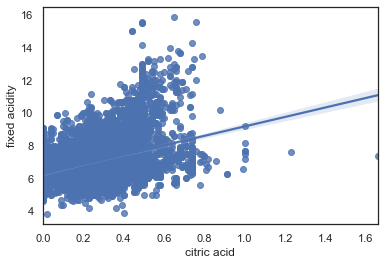

In [395]:
sns.regplot(x = 'citric acid', y = 'fixed acidity', data= wines);

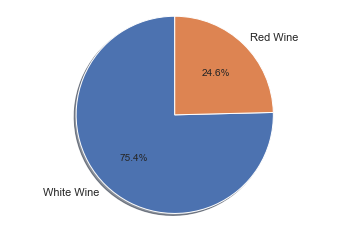

In [396]:
# Pie chart of wine type in wines dataset
labels = 'White Wine', 'Red Wine'
sizes = [4898, 1599]


fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

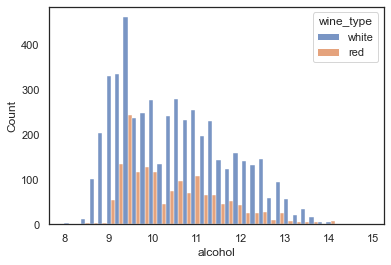

In [397]:
# How many instances of red & white wine are there (Histogram)
sns.histplot(data=wines, x="alcohol", hue="wine_type",  multiple="dodge");

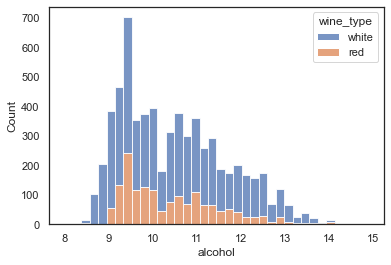

In [398]:
# How many instances of red & white wine are there (Histogram)
sns.histplot(data=wines, x="alcohol", hue="wine_type",  multiple="stack");

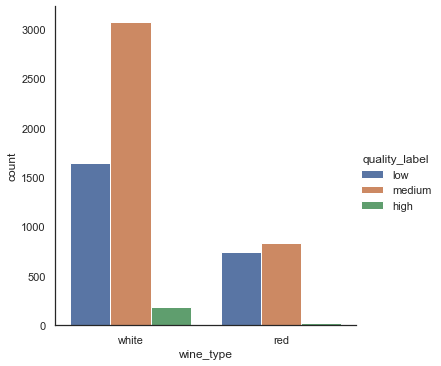

In [399]:
# Barplot by wine type and quality
sns.catplot(x="wine_type", hue = 'quality_label', data=wines, kind="count");

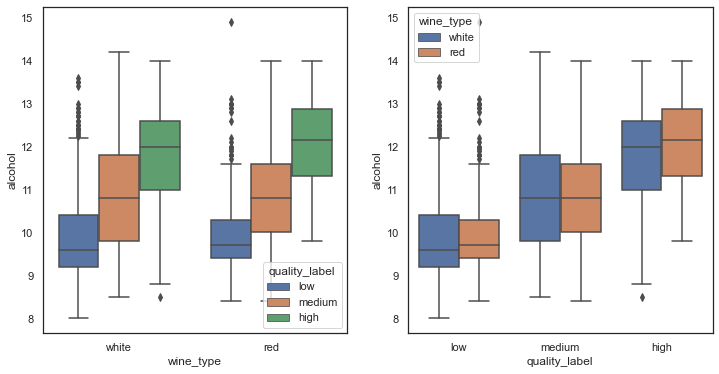

In [400]:
# Bloxplot quality label, wine type & alcohol

fig, ax = plt.subplots(1,2, figsize=(12, 6))

sns.boxplot(x="wine_type", y="alcohol", data=wines, hue = 'quality_label', ax=ax[0])
sns.boxplot(x="quality_label", y="alcohol", data=wines, hue = 'wine_type', ax = ax[1]);


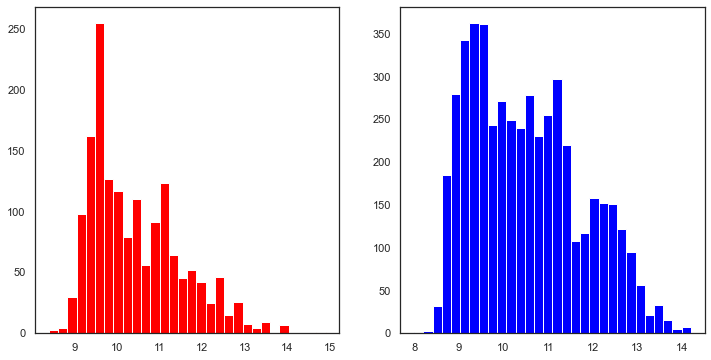

In [401]:
# histogram wine types & alcohol
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,2, figsize=(12, 6))

ax[0].hist( wines[wines['wine_type'] == 'red']['alcohol'], 30, color = 'red');
ax[1].hist( wines[wines['wine_type'] == 'white']['alcohol'], 30, color = 'blue');

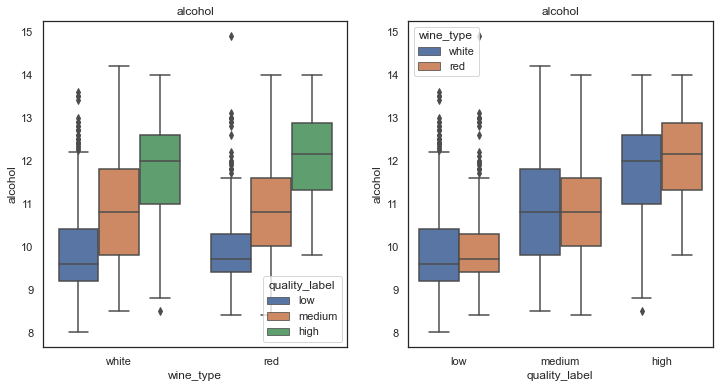

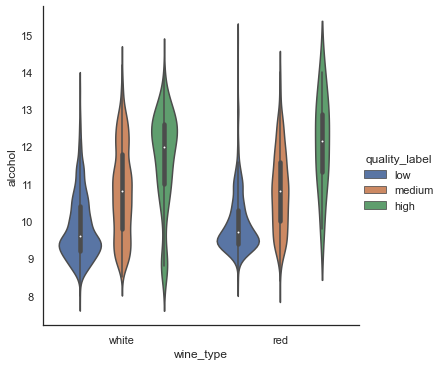

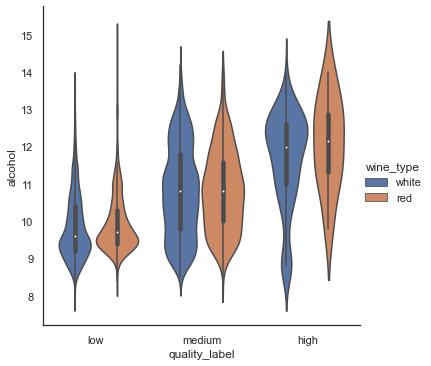

In [402]:
# alcohol
fig, ax = plt.subplots(1,2, figsize=(12, 6))

sns.boxplot(x="wine_type", y="alcohol", data=wines, hue = 'quality_label', ax=ax[0]).set_title("alcohol")
sns.boxplot(x="quality_label", y="alcohol", data=wines, hue = 'wine_type', ax = ax[1]).set_title("alcohol");
sns.catplot(x="wine_type", y="alcohol", hue = 'quality_label', data=wines, kind = 'violin');
sns.catplot(x="quality_label", y="alcohol", hue = 'wine_type', data=wines, kind = 'violin');

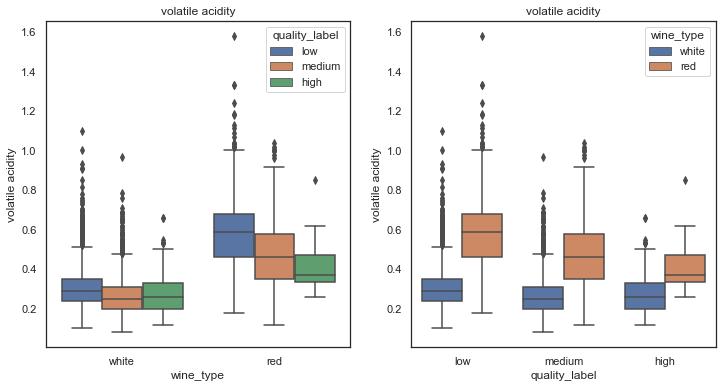

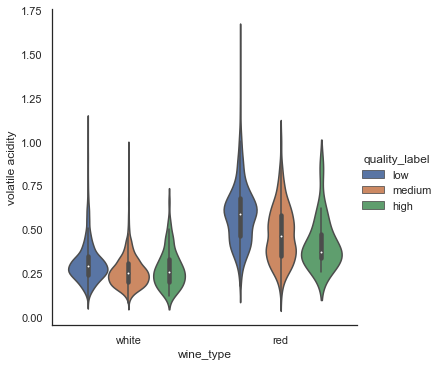

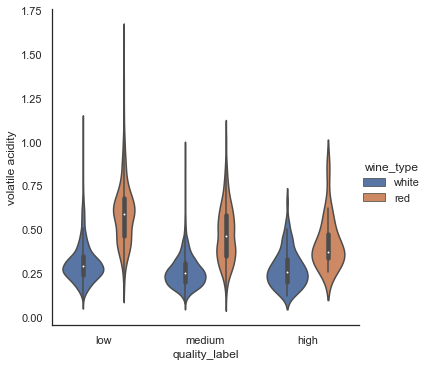

In [403]:
# volatile acidity
fig, ax = plt.subplots(1,2, figsize=(12, 6))
sns.boxplot(x="wine_type", y="volatile acidity", data=wines, hue = 'quality_label', ax=ax[0]).set_title("volatile acidity")
sns.boxplot(x="quality_label", y="volatile acidity", data=wines, hue = 'wine_type', ax = ax[1]).set_title("volatile acidity");
sns.catplot(x="wine_type", y="volatile acidity", hue = 'quality_label', data=wines, kind = 'violin');
sns.catplot(x="quality_label", y="volatile acidity", hue = 'wine_type', data=wines, kind = 'violin');

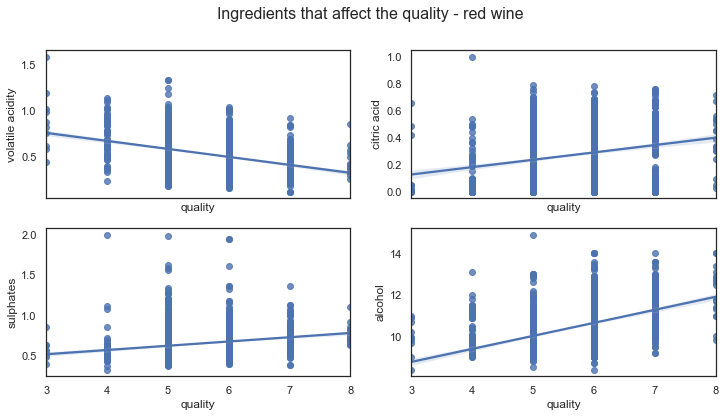

In [404]:
# red wine - features that affect the quality
red_wine_features_quality=fig, ax = plt.subplots(2,2, figsize=(12, 6), sharex=True)
fig.suptitle('Ingredients that affect the quality - red wine', fontsize=16)
sns.regplot(x="quality", y="volatile acidity", data=red_wine,ax=ax[0][0])
sns.regplot(x="quality", y="citric acid", data=red_wine,ax=ax[0][1])
sns.regplot(x="quality", y="sulphates", data=red_wine,ax=ax[1][0])
sns.regplot(x="quality", y="alcohol", data=red_wine,ax=ax[1][1]);
plt.savefig('fig3.jpg')

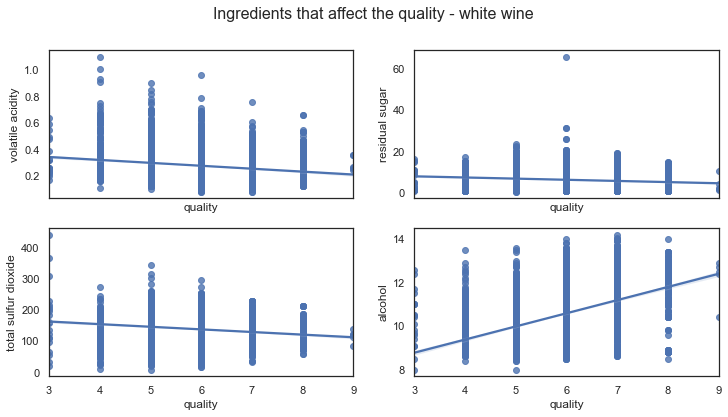

In [405]:
# white wine - features that affect the quality
fig, ax = plt.subplots(2,2, figsize=(12, 6), sharex=True)
fig.suptitle('Ingredients that affect the quality - white wine', fontsize=16)
sns.regplot(x="quality", y="volatile acidity", data=white_wine,ax=ax[0][0])
sns.regplot(x="quality", y="residual sugar", data=white_wine,ax=ax[0][1])
sns.regplot(x="quality", y="total sulfur dioxide", data=white_wine,ax=ax[1][0])
sns.regplot(x="quality", y="alcohol", data=white_wine,ax=ax[1][1]);
plt.savefig('fig4.jpg')

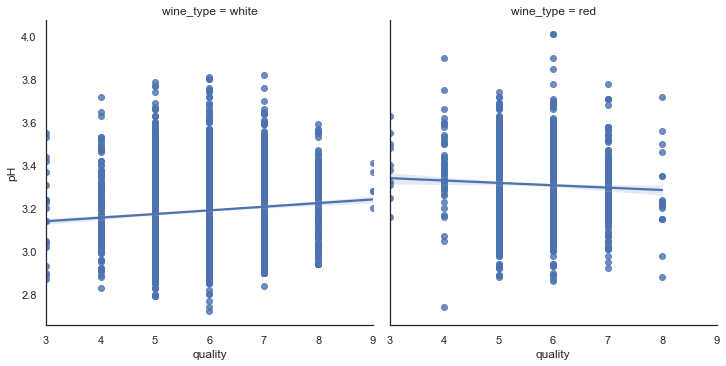

In [406]:
# how pH affect quality on different types of wine
sns.lmplot(x="quality", y="pH", data=wines, col="wine_type");

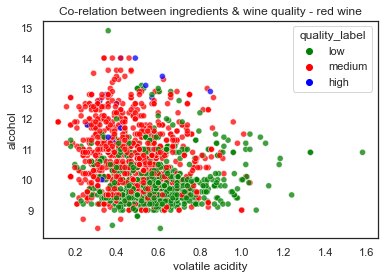

In [407]:
# scatter plot red wine - volatily acidity & alcohol - there is correlation

sns.scatterplot(data=red_wine, x="volatile acidity", y='alcohol', hue = 'quality_label', palette=["green", "red", "blue"], alpha = 0.75);
sns.set(rc={'figure.figsize':(6, 3)})
plt.title("Co-relation between ingredients & wine quality - red wine");
plt.savefig('fig6.jpg')

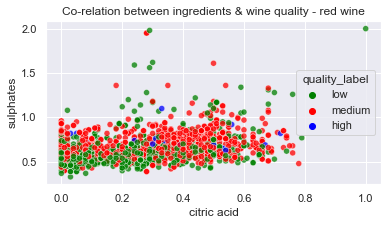

In [408]:
# scatter plot red wine - sulphates & citric acid - there is no correlation

sns.scatterplot(data=red_wine, x="citric acid", y='sulphates', hue = 'quality_label', palette=["green", "red", "blue"], alpha = 0.75);
sns.set(rc={'figure.figsize':(6, 5)})
plt.title("Co-relation between ingredients & wine quality - red wine");
plt.savefig('fig5.jpg')

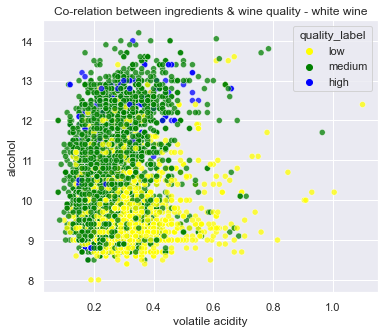

In [409]:
# scatter plot white wine - volatile acidity & alcohol

sns.scatterplot(data=white_wine, x="volatile acidity", y='alcohol', hue = 'quality_label', palette=["yellow", "green", "blue"], alpha = 0.75);
sns.set(rc={'figure.figsize':(6, 4)})
plt.title("Co-relation between ingredients & wine quality - white wine");
plt.savefig('fig7.jpg')

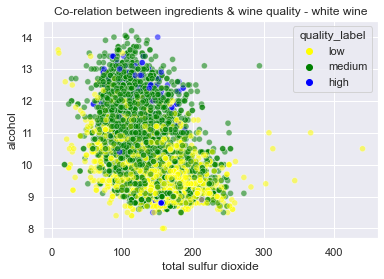

In [410]:
# scatter plot white wine - total sulfur dioxide & alcohol

sns.scatterplot(data=white_wine, x="total sulfur dioxide", y='alcohol', hue = 'quality_label', palette=["yellow", "green", "blue"], alpha = 0.55);
sns.set(rc={'figure.figsize':(6, 4)})
plt.title("Co-relation between ingredients & wine quality - white wine");
plt.savefig('fig8.jpg')

In [411]:
# red wine - high total sulfur dioxide, high sulphates, low quality
red_wine[(red_wine["total sulfur dioxide"].between(0,50, inclusive=False)) & (red_wine["sulphates"].between(0.80,1.25, inclusive=False)) & (red_wine["quality_label"]=="low")]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label
22,7.9,0.43,0.21,1.6,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5,red,low
27,7.9,0.43,0.21,1.6,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5,red,low
43,8.1,0.66,0.22,2.2,0.069,9.0,23.0,0.99680,3.30,1.20,10.3,5,red,low
110,7.8,0.56,0.19,1.8,0.104,12.0,47.0,0.99640,3.19,0.93,9.5,5,red,low
114,7.8,0.56,0.19,1.8,0.104,12.0,47.0,0.99640,3.19,0.93,9.5,5,red,low
161,7.6,0.68,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2,4,red,low
264,12.5,0.56,0.49,2.4,0.064,5.0,27.0,0.99990,3.08,0.87,10.9,5,red,low
327,10.3,0.44,0.50,4.5,0.107,5.0,13.0,0.99800,3.28,0.83,11.5,5,red,low
363,12.5,0.46,0.63,2.0,0.071,6.0,15.0,0.99880,2.99,0.87,10.2,5,red,low
465,10.0,0.29,0.40,2.9,0.098,10.0,26.0,1.00060,3.48,0.91,9.7,5,red,low


In [412]:
# red wine -  high total sulfur dioxide, high alcohol, low quality

red_wine[(red_wine["total sulfur dioxide"].between(0,50, inclusive=False)) & (red_wine["alcohol"].between(11.5,13, inclusive=False))  & (red_wine["quality_label"]=="low")]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label
462,11.0,0.260,0.68,2.55,0.085,10.0,25.0,0.99700,3.18,0.61,11.80,5,red,low
900,8.9,0.310,0.36,2.60,0.056,10.0,39.0,0.99562,3.40,0.69,11.80,5,red,low
1052,5.6,0.605,0.05,2.40,0.073,19.0,25.0,0.99258,3.56,0.55,12.90,5,red,low
1105,6.3,0.570,0.28,2.10,0.048,13.0,49.0,0.99374,3.41,0.60,12.80,5,red,low
1119,5.6,0.660,0.00,2.50,0.066,7.0,15.0,0.99256,3.52,0.58,12.90,5,red,low
1186,6.6,0.800,0.03,7.80,0.079,6.0,12.0,0.99630,3.52,0.50,12.20,5,red,low
1239,6.5,0.670,0.00,4.30,0.057,11.0,20.0,0.99488,3.45,0.56,11.80,4,red,low
1276,8.5,0.400,0.40,6.30,0.050,3.0,10.0,0.99566,3.28,0.56,12.00,4,red,low
1443,6.9,0.580,0.20,1.75,0.058,8.0,22.0,0.99322,3.38,0.49,11.70,5,red,low
1471,6.7,0.700,0.08,3.75,0.067,8.0,16.0,0.99334,3.43,0.52,12.60,5,red,low


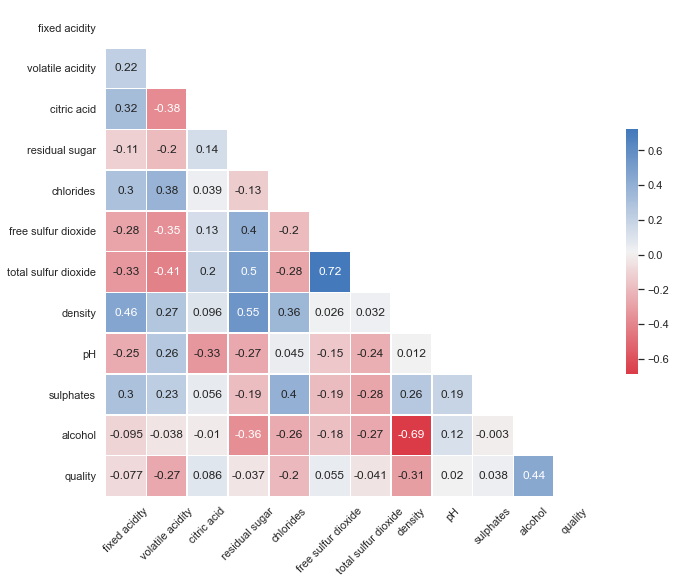

In [413]:
# correlation 

wines_heatmap = wines.iloc[:,:-2]
correlation_mat = wines_heatmap.corr()

# sns.heatmap(correlation_mat, annot = True)

# Exclude duplicate correlations by masking uper right values
mask = np.zeros_like(correlation_mat, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set background color / chart style
sns.set_style(style = 'white')

# Set up  matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Add diverging colormap
cmap = sns.diverging_palette(10, 250, as_cmap=True)

# Draw correlation plot
sns.heatmap(correlation_mat, mask=mask, cmap=cmap, 
        square=True, annot=True,
        linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)

plt.xticks(rotation=45)
plt.savefig("wine-fig-corr.png", format='png',dpi=300)

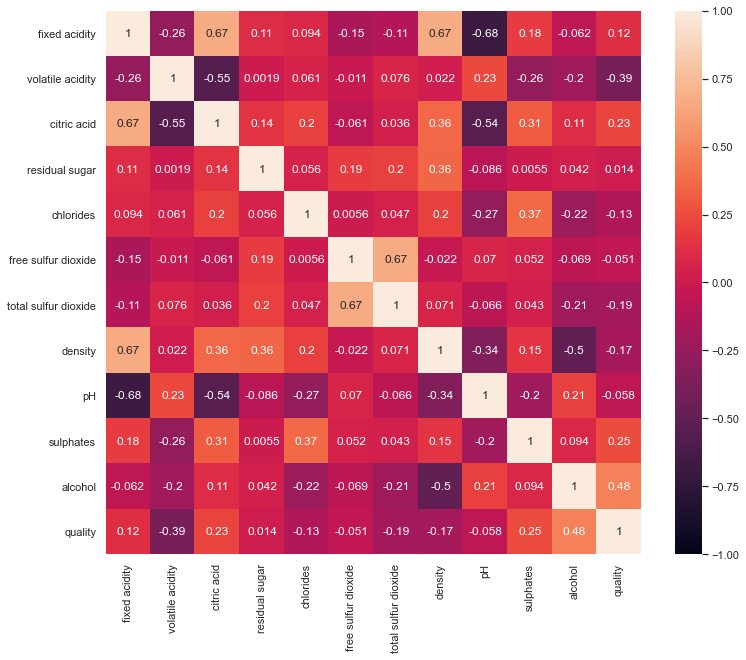

In [414]:
# Red Wine correlation heatmap
corr = red_wine.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, vmin=-1.0, vmax=1.0)
plt.show()

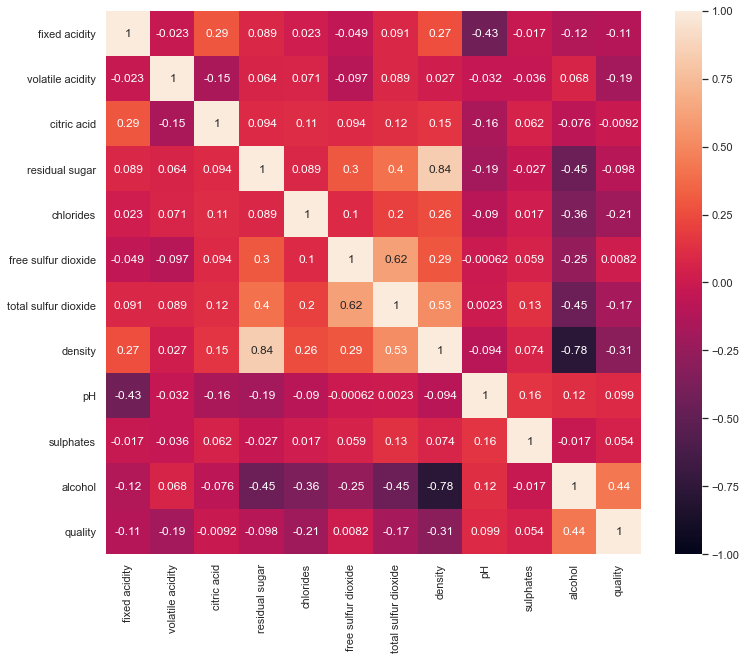

In [415]:
# White Wine correlation heatmap
corr = white_wine.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, vmin=-1.0, vmax=1.0)
plt.show()

In [416]:
#One hot encoding

#df = pd.get_dummies(wines['type'])
# pd.concat([wines. df], axis = 1, inplace = True)
# pd.drop("wine_type", axis = 1, inplace = True)

In [417]:
#le = LabelEncoder()
#wines['quality_label'] = le.fit_transform(wines['quality_label'])
#wines['type'] = le.fit_transform(wines['wine_type'])

In [420]:
# Create X and y
X = wines.drop(['quality', 'wine_type', 'quality_label'], axis = 1)
#y = wines['type']
y = wines['quality_label']

In [480]:
# Standarization - StandardScaler
#from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X = np.array(X)
scaler.fit(X)
X = scaler.transform(X)


In [472]:
# Standarization - MinMaxScaler
#from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler()

#X = np.array(X)
#scaler.fit(X)
#X = scaler.transform(X)

In [481]:
# Split the data into train and test

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=5)

In [482]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(X_train, y_train)
lr.score(X_train, y_train)
y_pred = lr.predict(X_test)
print(classification_report(y_test,y_pred))


              precision    recall  f1-score   support

        high       0.00      0.00      0.00        60
         low       0.68      0.60      0.64       610
      medium       0.72      0.83      0.77       955

    accuracy                           0.71      1625
   macro avg       0.47      0.47      0.47      1625
weighted avg       0.68      0.71      0.69      1625



In [483]:
# Confusion matrix Logistic Regression quality label

print(confusion_matrix(y_test, y_pred))
print("accuracy:" ,accuracy_score(y_test, y_pred))
kappa_lr=kappa(y_pred, y_test)
print("Kappa:", kappa_lr) 


[[  0   3  57]
 [  0 363 247]
 [  0 165 790]]
accuracy: 0.7095384615384616
Kappa: 0.39698650491963094


In [484]:
# KNN K-Nearest Neighbours

from sklearn.neighbors import KNeighborsClassifier

neigh = RandomForestClassifier()
neigh.fit(X_train, y_train)
neigh.score(X_test, y_test)
y_pred = neigh.predict(X_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

        high       0.96      0.40      0.56        60
         low       0.81      0.75      0.78       610
      medium       0.82      0.89      0.85       955

    accuracy                           0.82      1625
   macro avg       0.86      0.68      0.73      1625
weighted avg       0.82      0.82      0.81      1625



In [485]:
# Confusion matrix kNN quality label

print(confusion_matrix(y_test, y_pred))
print("accuracy:" ,accuracy_score(y_test, y_pred))
kappa_neigh=kappa(y_pred, y_test)
print("Kappa:", kappa_neigh) 

[[ 24   0  36]
 [  0 458 152]
 [  1 108 846]]
accuracy: 0.8172307692307692
Kappa: 0.6305673245840653


In [490]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf.score(X_test, y_test)
y_pred = rf.predict(X_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

        high       0.96      0.40      0.56        60
         low       0.81      0.77      0.79       610
      medium       0.83      0.89      0.86       955

    accuracy                           0.82      1625
   macro avg       0.87      0.68      0.74      1625
weighted avg       0.83      0.82      0.82      1625



In [489]:
# Confusion matrix Random Forest quality label

print(confusion_matrix(y_test, y_pred))
print("accuracy:" ,accuracy_score(y_test, y_pred))
kappa_rf=kappa(y_pred, y_test)
print("Kappa:", kappa_rf) 

[[ 24   0  36]
 [  0 458 152]
 [  1 102 852]]
accuracy: 0.820923076923077
Kappa: 0.6374561554827209


In [429]:
# Import Prices Dataset
wine_sales = pd.read_csv('wine_sales_data.csv')
wine_sales

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
2,2,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,4,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude
...,...,...,...,...,...,...,...,...,...,...,...
150925,150925,Italy,Many people feel Fiano represents southern Ita...,NaN,91,20.0,Southern Italy,Fiano di Avellino,NaN,White Blend,Feudi di San Gregorio
150926,150926,France,"Offers an intriguing nose with ginger, lime an...",Cuvée Prestige,91,27.0,Champagne,Champagne,NaN,Champagne Blend,H.Germain
150927,150927,Italy,This classic example comes from a cru vineyard...,Terre di Dora,91,20.0,Southern Italy,Fiano di Avellino,NaN,White Blend,Terredora
150928,150928,France,"A perfect salmon shade, with scents of peaches...",Grand Brut Rosé,90,52.0,Champagne,Champagne,NaN,Champagne Blend,Gosset


In [430]:
wine_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150930 entries, 0 to 150929
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   150930 non-null  int64  
 1   country      150925 non-null  object 
 2   description  150930 non-null  object 
 3   designation  105195 non-null  object 
 4   points       150930 non-null  int64  
 5   price        137235 non-null  float64
 6   province     150925 non-null  object 
 7   region_1     125870 non-null  object 
 8   region_2     60953 non-null   object 
 9   variety      150930 non-null  object 
 10  winery       150930 non-null  object 
dtypes: float64(1), int64(2), object(8)
memory usage: 12.7+ MB


In [431]:
wine_sales.head()

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
2,2,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,4,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude


In [432]:
wine_sales.isnull().sum()

Unnamed: 0         0
country            5
description        0
designation    45735
points             0
price          13695
province           5
region_1       25060
region_2       89977
variety            0
winery             0
dtype: int64

In [433]:
wine_sales.describe()

,Unnamed: 0,points,price
count,150930.000000,150930.000000,137235.000000
mean,75464.500000,87.888418,33.131482
std,43569.882402,3.222392,36.322536
min,0.000000,80.000000,4.000000
25%,37732.250000,86.000000,16.000000
50%,75464.500000,88.000000,24.000000
75%,113196.750000,90.000000,40.000000
max,150929.000000,100.000000,2300.000000


In [434]:
# Create a new DataFrame with all wines in Portugal and in Vinho Verde province
PT_VV = wine_sales[((wine_sales["country"]== "Portugal") & (wine_sales["province"]== "Vinho Verde"))]
PT_VV

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
277,277,Portugal,"Pure Alvarinho from the Monção region, it's ri...",Portal do Fidalgo,92,35.0,Vinho Verde,NaN,NaN,Alvarinho,Provam
993,993,Portugal,"With its typical prickle on the tongue, this i...",Campelo,85,10.0,Vinho Verde,NaN,NaN,Portuguese White,Caves Campelo
994,994,Portugal,"Lightly spritzy, this tastes of crisp apple an...",Miranda,85,9.0,Vinho Verde,NaN,NaN,Portuguese White,Caves Campelo
1378,1378,Portugal,Some wood aging has rounded out this fruity wi...,Daphne,91,NaN,Vinho Verde,NaN,NaN,Loureiro,Casal Paço Padreiro
1558,1558,Portugal,This medium-sweet rosé is a familiar style of ...,Campelo,84,10.0,Vinho Verde,NaN,NaN,Rosé,Caves Campelo
...,...,...,...,...,...,...,...,...,...,...,...
141129,141129,Portugal,"A simple, rather earthy, dry style of vinho ve...",NaN,83,9.0,Vinho Verde,NaN,NaN,Portuguese White,Adega Cooperativa Ponte de Lima
141143,141143,Portugal,The estate wine from Vila Verde which is in Lo...,NaN,82,8.0,Vinho Verde,NaN,NaN,Portuguese White,Casa de Vila Verde
141148,141148,Portugal,"The standard style of inexpensive Vinho Verde,...",Gatão,82,6.0,Vinho Verde,NaN,NaN,Portuguese White,Borges
143472,143472,Portugal,"Very nice Vinho Verde, with fresh, green apple...",NaN,86,9.0,Vinho Verde,NaN,NaN,White Blend,Casa de Vila Verde


In [435]:
PT_VV.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 396 entries, 277 to 143575
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   396 non-null    int64  
 1   country      396 non-null    object 
 2   description  396 non-null    object 
 3   designation  301 non-null    object 
 4   points       396 non-null    int64  
 5   price        310 non-null    float64
 6   province     396 non-null    object 
 7   region_1     0 non-null      object 
 8   region_2     0 non-null      object 
 9   variety      396 non-null    object 
 10  winery       396 non-null    object 
dtypes: float64(1), int64(2), object(8)
memory usage: 37.1+ KB


In [436]:
# Understanding new DataFrame
PT_VV.describe()

,Unnamed: 0,points,price
count,396.000000,396.000000,310.000000
mean,70480.558081,86.409091,11.400000
std,42469.897042,2.491366,4.821205
min,277.000000,80.000000,5.000000
25%,33405.000000,85.000000,8.000000
50%,72737.500000,86.000000,10.000000
75%,105342.250000,88.000000,13.000000
max,143575.000000,92.000000,45.000000


In [437]:
# Discover missing values -  There are 86 missing values in the price column
PT_VV.isnull().sum()

Unnamed: 0       0
country          0
description      0
designation     95
points           0
price           86
province         0
region_1       396
region_2       396
variety          0
winery           0
dtype: int64

In [438]:
# sort by points and count how many instances are in each point
PT_VV['points'].value_counts().sort_index(ascending=True)

80     3
82    11
83    23
84    60
85    85
86    39
87    28
88    53
89    30
90    49
91    12
92     3
Name: points, dtype: int64

In [439]:
# Group the wines by points and find out the mean
points_av = PT_VV.groupby("points").mean()
points_av

,Unnamed: 0,price
points,,
80,38659.666667,8.000000
82,55707.545455,8.300000
83,65310.913043,7.500000
84,64456.600000,8.244444
85,66731.094118,9.918033
86,70691.487179,10.225806
87,70621.535714,12.714286
88,71340.094340,12.847826
89,87945.166667,13.653846


In [440]:
# Fill all missing values on price column with the mean of points
PT_VV['price'] = PT_VV.groupby(['points'], sort=False)['price'].apply(lambda x: x.fillna(x.mean()))


In [441]:
# Check if there are missing values on price column
PT_VV.isnull().sum()

Unnamed: 0       0
country          0
description      0
designation     95
points           0
price            0
province         0
region_1       396
region_2       396
variety          0
winery           0
dtype: int64

In [442]:
# Analyze how descriptive statitic values have changed after adding missing values
PT_VV.describe()

,Unnamed: 0,points,price
count,396.000000,396.000000,396.000000
mean,70480.558081,86.409091,11.434846
std,42469.897042,2.491366,4.457133
min,277.000000,80.000000,5.000000
25%,33405.000000,85.000000,8.286111
50%,72737.500000,86.000000,10.000000
75%,105342.250000,88.000000,13.000000
max,143575.000000,92.000000,45.000000


In [443]:
# Remove price outliers and create a new DataFrame without outliers

q_low = PT_VV["price"].quantile(0.25)
q_hi  = PT_VV["price"].quantile(0.75)

PT_VV_filt = PT_VV[(PT_VV["price"] < q_hi) & (PT_VV["price"] > q_low)]
PT_VV_filt

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
993,993,Portugal,"With its typical prickle on the tongue, this i...",Campelo,85,10.0,Vinho Verde,NaN,NaN,Portuguese White,Caves Campelo
994,994,Portugal,"Lightly spritzy, this tastes of crisp apple an...",Miranda,85,9.0,Vinho Verde,NaN,NaN,Portuguese White,Caves Campelo
1558,1558,Portugal,This medium-sweet rosé is a familiar style of ...,Campelo,84,10.0,Vinho Verde,NaN,NaN,Rosé,Caves Campelo
1559,1559,Portugal,"Soft, light and fruity, this wine is ready for...",Casal da Seara,84,10.0,Vinho Verde,NaN,NaN,Portuguese White,Caves Campelo
1694,1694,Portugal,"Crisp, dry and fresh, this is a lively and fru...",Torre de Vila Nova,88,12.0,Vinho Verde,NaN,NaN,Portuguese White,Casa de Vila Nova
...,...,...,...,...,...,...,...,...,...,...,...
139675,139675,Portugal,"The perfect summer apéritif, this light, fresh...",Twin Vines,85,9.0,Vinho Verde,NaN,NaN,Portuguese White,José Maria da Fonseca
140222,140222,Portugal,"As it should be from the year and the grape, t...",NaN,85,12.0,Vinho Verde,NaN,NaN,Alvarinho,Casa de Vila Verde
140230,140230,Portugal,"Although it is a sweeter style, this is much f...",Adamado,84,9.0,Vinho Verde,NaN,NaN,Portuguese White,Adega Cooperativa Ponte de Lima
141129,141129,Portugal,"A simple, rather earthy, dry style of vinho ve...",NaN,83,9.0,Vinho Verde,NaN,NaN,Portuguese White,Adega Cooperativa Ponte de Lima


In [444]:
PT_VV_filt.describe()

,Unnamed: 0,points,price
count,182.000000,182.000000,182.000000
mean,65676.928571,86.076923,10.467440
std,43061.377031,1.936739,1.252697
min,993.000000,82.000000,8.300000
25%,29139.500000,85.000000,9.918033
50%,64466.500000,86.000000,10.000000
75%,100467.000000,88.000000,12.000000
max,143472.000000,90.000000,12.847826


In [445]:
# Create 3 different bins for 3 prices ranges 
prices_range=PT_VV_filt['price'].value_counts(bins=3).sort_index(ascending=True)
prices_range

(8.294, 9.816]      45
(9.816, 11.332]     85
(11.332, 12.848]    52
Name: price, dtype: int64

In [446]:
# Create a new column on the original dataset wines with recomended price range according to quality_label 
wines['price'] = wines['quality_label'].apply(lambda value: '8.294, 9.816'
if value == "low" else '9.816, 11.332'
if value == "medium" else '11.332, 12.848')

In [447]:
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label,price
0,7.0,0.17,0.74,12.80,0.045,24.0,126.0,0.99420,3.26,0.38,12.2,8,white,high,"11.332, 12.848"
1,7.7,0.64,0.21,2.20,0.077,32.0,133.0,0.99560,3.27,0.45,9.9,5,red,low,"8.294, 9.816"
2,6.8,0.39,0.34,7.40,0.020,38.0,133.0,0.99212,3.18,0.44,12.0,7,white,medium,"9.816, 11.332"
3,6.3,0.28,0.47,11.20,0.040,61.0,183.0,0.99592,3.12,0.51,9.5,6,white,medium,"9.816, 11.332"
4,7.4,0.35,0.20,13.90,0.054,63.0,229.0,0.99888,3.11,0.50,8.9,6,white,medium,"9.816, 11.332"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,7.6,0.32,0.58,16.75,0.050,43.0,163.0,0.99990,3.15,0.54,9.2,5,white,low,"8.294, 9.816"
6493,5.6,0.28,0.27,3.90,0.043,52.0,158.0,0.99202,3.35,0.44,10.7,7,white,medium,"9.816, 11.332"
6494,6.4,0.37,0.20,5.60,0.117,61.0,183.0,0.99459,3.24,0.43,9.5,5,white,low,"8.294, 9.816"
6495,6.5,0.26,0.50,8.00,0.051,46.0,197.0,0.99536,3.18,0.47,9.5,5,white,low,"8.294, 9.816"


In [448]:
# DataFrame with all wines produced in Portugal
PT = wine_sales[wine_sales['country'] == 'Portugal'] 
# DataFrame with all wines produced in Portugal & region Vinho Verde
PT_VV

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
277,277,Portugal,"Pure Alvarinho from the Monção region, it's ri...",Portal do Fidalgo,92,35.000000,Vinho Verde,NaN,NaN,Alvarinho,Provam
993,993,Portugal,"With its typical prickle on the tongue, this i...",Campelo,85,10.000000,Vinho Verde,NaN,NaN,Portuguese White,Caves Campelo
994,994,Portugal,"Lightly spritzy, this tastes of crisp apple an...",Miranda,85,9.000000,Vinho Verde,NaN,NaN,Portuguese White,Caves Campelo
1378,1378,Portugal,Some wood aging has rounded out this fruity wi...,Daphne,91,16.428571,Vinho Verde,NaN,NaN,Loureiro,Casal Paço Padreiro
1558,1558,Portugal,This medium-sweet rosé is a familiar style of ...,Campelo,84,10.000000,Vinho Verde,NaN,NaN,Rosé,Caves Campelo
...,...,...,...,...,...,...,...,...,...,...,...
141129,141129,Portugal,"A simple, rather earthy, dry style of vinho ve...",NaN,83,9.000000,Vinho Verde,NaN,NaN,Portuguese White,Adega Cooperativa Ponte de Lima
141143,141143,Portugal,The estate wine from Vila Verde which is in Lo...,NaN,82,8.000000,Vinho Verde,NaN,NaN,Portuguese White,Casa de Vila Verde
141148,141148,Portugal,"The standard style of inexpensive Vinho Verde,...",Gatão,82,6.000000,Vinho Verde,NaN,NaN,Portuguese White,Borges
143472,143472,Portugal,"Very nice Vinho Verde, with fresh, green apple...",NaN,86,9.000000,Vinho Verde,NaN,NaN,White Blend,Casa de Vila Verde


In [449]:
# Most produced wine varieties in Vinho Verde
PT_VV['variety'].value_counts(ascending=False)

Portuguese White        240
Loureiro                 45
Alvarinho                43
Rosé                     43
Portuguese Red            9
Vinhão                    5
Avesso                    3
Portuguese Sparkling      2
Arinto                    2
Azal                      1
Portuguese Rosé           1
White Blend               1
Espadeiro                 1
Name: variety, dtype: int64

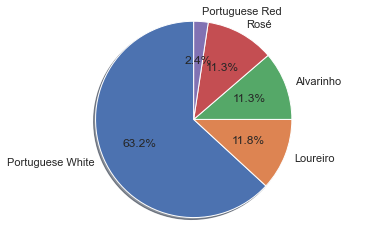

In [450]:
# Pie chart with most produced wine varieties in Vinho Verde
labels = 'Portuguese White', 'Loureiro', 'Alvarinho', 'Rosé', 'Portuguese Red'
sizes = [240, 45, 43, 43, 9]


fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')

plt.show()

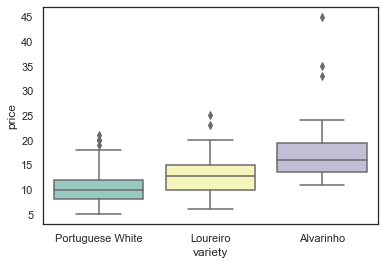

In [451]:
# Create a new DataFrame with the top 3 white wine varieties produce in the province of Vinho Verde
VV_price = PT_VV[PT_VV.variety.isin(["Portuguese White", "Loureiro", "Alvarinho"])]

# Price of white wine in Vinho Verde
ax = sns.boxplot(x="variety", y="price", data=VV_price,
                 order=['Portuguese White','Loureiro','Alvarinho'], palette="Set3")

In [452]:
# Find out the top 10 countries that produce more wine around the world
wine_sales['country'].value_counts(ascending=False).head(10)

US             62397
Italy          23478
France         21098
Spain           8268
Chile           5816
Argentina       5631
Portugal        5322
Australia       4957
New Zealand     3320
Austria         3057
Name: country, dtype: int64

In [453]:
# Wines on the same area - Tejo
tejo = PT[PT["province"]=="Tejo"]

# Count the varieties of wine, that are produced in Tejo
tejo['variety'].value_counts(ascending=False)

Portuguese Red                         178
Portuguese White                        93
Rosé                                    33
Touriga Nacional-Cabernet Sauvignon     17
Touriga Nacional                        16
Arinto                                  14
Fernão Pires                            12
Syrah                                   10
Cabernet Sauvignon                       7
Alfrocheiro                              5
White Blend                              4
Viognier                                 4
Sauvignon Blanc                          4
Alvarinho                                3
Merlot                                   3
Touriga Nacional Blend                   2
Portuguese Sparkling                     2
Verdelho                                 2
Trincadeira                              2
Alicante Bouschet                        2
Gewürztraminer-Riesling                  1
Castelão                                 1
Portuguese Rosé                          1
Alvarinho-C

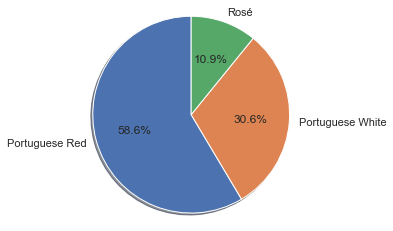

In [454]:
# Pie chart Top 3 Varieties of wine in Trejo
labels = 'Portuguese Red', 'Portuguese White', 'Rosé'
sizes = [178, 93, 33]


fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  

plt.show()

In [455]:
# Wines on the same area - Port
port = PT[PT["province"]=="Port"]

# Which varieties of wine are produced
port['variety'].value_counts(ascending=False)

Port          898
White Port      3
Red Blend       2
Name: variety, dtype: int64

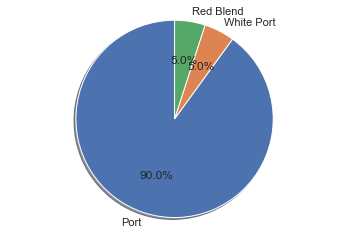

In [456]:
# Pie chart Top 3 Varieties of wine in Port

labels = 'Port', 'White Port', 'Red Blend'
sizes = [90, 5, 5]

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

In [457]:
# Top 15 varieties of wine worldwide
wine_sales['variety'].value_counts(ascending=False).head(15)

Chardonnay                  14482
Pinot Noir                  14291
Cabernet Sauvignon          12800
Red Blend                   10062
Bordeaux-style Red Blend     7347
Sauvignon Blanc              6320
Syrah                        5825
Riesling                     5524
Merlot                       5070
Zinfandel                    3799
Sangiovese                   3345
Malbec                       3208
White Blend                  2824
Rosé                         2817
Tempranillo                  2556
Name: variety, dtype: int64

In [458]:
# New DataFrame with only country, price and variety columns
wine_sale_s = wine_sales[['country', 'price', 'variety']].copy()


In [459]:
# Top 10 world producers of white wine variety Chardonnay
wine_sale_s[wine_sale_s['variety']=="Chardonnay"].groupby(by=["country"]).count().sort_values(by='variety', ascending=False).head(10)

,price,variety
country,,
US,8101,8127
France,2345,2892
Chile,744,752
Australia,667,669
Italy,450,511
Argentina,459,462
New Zealand,425,454
South Africa,274,274
Israel,70,71


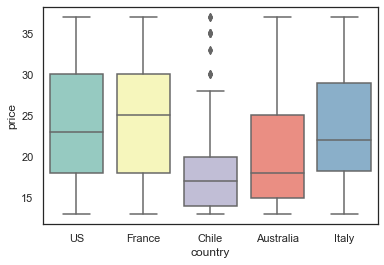

In [460]:
# Create a new DataFrame with the Top 5 Chardonnay producers
char = wine_sales[wine_sales.variety == 'Chardonnay'][wine_sales.country.isin(['US','France','Chile','Australia','Italy'])]

# Remove price outliers from Chardonnay DataFrame
q_low = char["price"].quantile(0.10)
q_hi  = char["price"].quantile(0.75)

char_filtered = char[(char["price"] < q_hi) & (char["price"] > q_low)]

# Boxplot comparing price and the top 5 Chardonnay producers 
ax = sns.boxplot(x="country", y="price", data=char_filtered,
                 order=['US','France','Chile','Australia','Italy'], palette="Set3")

In [461]:
# Top 10 world producers of white wine variety Sauvignon Blanc
wine_sale_s[wine_sale_s['variety']=="Sauvignon Blanc"].groupby(by=["country"]).count().sort_values(by='variety', ascending=False).head(10)

,price,variety
country,,
US,2582,2586
New Zealand,1085,1118
France,752,930
Chile,737,739
South Africa,338,342
Argentina,149,149
Australia,131,133
Austria,91,121
Italy,51,58


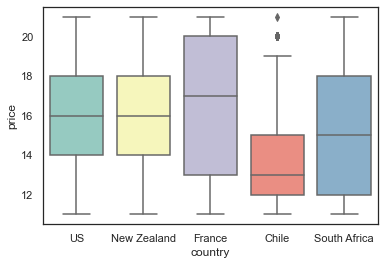

In [462]:
# Create a new DataFrame with the Top 5 Sauvignon Blanc producers
saublanc = wine_sales[wine_sales.variety == 'Sauvignon Blanc'][wine_sales.country.isin(['US','New Zealand','France','Chile','South Africa'])]

# Remove price outliers from Sauvignon Blanc DataFrame
q_low = saublanc["price"].quantile(0.10)
q_hi  = saublanc["price"].quantile(0.75)

saublanc_filtered = saublanc[(saublanc["price"] < q_hi) & (saublanc["price"] > q_low)]

# Boxplot comparing price and the top 5 Sauvignon Blanc producers 
ax = sns.boxplot(x="country", y="price", data=saublanc_filtered,
                 order=['US','New Zealand','France','Chile','South Africa'], palette="Set3")

In [463]:
# Top 10 world producers of white wine variety Riesling
wine_sale_s[wine_sale_s['variety']=="Riesling"].groupby(by=["country"]).count().sort_values(by='variety', ascending=False).head(10)

,price,variety
country,,
Germany,2002,2094
US,1651,1652
Austria,428,536
France,431,501
New Zealand,273,300
Australia,279,286
Canada,60,62
Italy,30,34
Chile,20,21


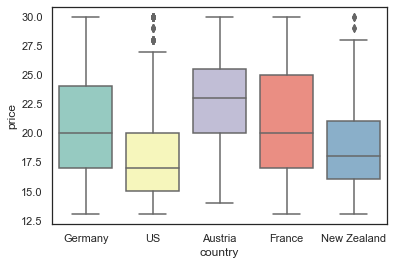

In [464]:
# Create a new DataFrame with the Top 5 Riesling producers
ries = wine_sales[wine_sales.variety == 'Riesling'][wine_sales.country.isin(['Germany','US','Austria','France','New Zealand'])]

# Remove price outliers from Riesling DataFrame
q_low = ries["price"].quantile(0.10)
q_hi  = ries["price"].quantile(0.75)

ries_filtered = ries[(ries["price"] < q_hi) & (ries["price"] > q_low)]

# Boxplot comparing price and the top 5 Riesling producers 
ax = sns.boxplot(x="country", y="price", data=ries_filtered,
                 order=['Germany','US','Austria','France','New Zealand'], palette="Set3")

In [465]:
# Top 10 world producers of white wine variety White Blend
wine_sale_s[wine_sale_s['variety']=="White Blend"].groupby(by=["country"]).count().sort_values(by='variety', ascending=False).head(10)

,price,variety
country,,
Italy,797,989
US,663,665
Spain,364,367
France,225,265
Greece,133,133
Austria,67,92
South Africa,67,67
Australia,46,49
Argentina,49,49


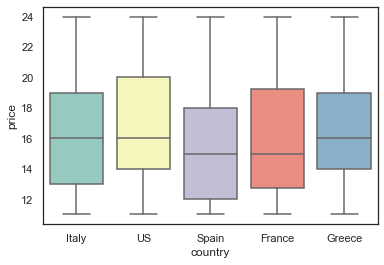

In [466]:
# Create a new DataFrame with the Top 5 White Blend producers
wblend = wine_sales[wine_sales.variety == 'White Blend'][wine_sales.country.isin(['Italy','US','Spain','France','Greece'])]

# Remove price outliers from White Blend DataFrame
q_low = wblend["price"].quantile(0.10)
q_hi  = wblend["price"].quantile(0.75)

wblend_filtered = wblend[(wblend["price"] < q_hi) & (wblend["price"] > q_low)]

# Boxplot comparing price and the top 5 White Blend producers 
ax = sns.boxplot(x="country", y="price", data=wblend_filtered, order=['Italy','US','Spain','France','Greece'], palette="Set3")

In [467]:
PT[PT["variety"]=="Portuguese White"].groupby(by="province").count().sort_values(by='province', ascending=False).head(10)

,Unnamed: 0,country,description,designation,points,price,region_1,region_2,variety,winery
province,,,,,,,,,,
Vinho Verde,240,240,240,200,240,195,0,0,240,240
Trás-os-Montes,3,3,3,3,3,0,0,0,3,3
Transmontano,1,1,1,1,1,0,0,0,1,1
Terras do Sado,4,4,4,4,4,1,0,0,4,4
Tejo,93,93,93,80,93,70,0,0,93,93
Setubal,8,8,8,8,8,6,0,0,8,8
Ribatejo,8,8,8,5,8,6,0,0,8,8
Ribatejano,3,3,3,3,3,3,0,0,3,3
Portuguese Table Wine,3,3,3,3,3,0,0,0,3,3


In [468]:
# Which varieties of wine are produced in Portugal
PT['variety'].value_counts(ascending=False)

Portuguese Red              2216
Portuguese White             941
Port                         924
Touriga Nacional             169
Rosé                         163
                            ... 
Chenin Blanc                   1
Gewürztraminer                 1
Sémillon                       1
Albana                         1
Cabernet Sauvignon-Syrah       1
Name: variety, Length: 78, dtype: int64

In [469]:
# Top 10 provinces producing Portuguese White
PT[PT["variety"]=="Portuguese White"]["province"].value_counts(ascending=False).head(10)

Vinho Verde             240
Douro                   182
Alentejano              159
Tejo                     93
Lisboa                   65
Dão                      47
Península de Setúbal     30
Alentejo                 26
Bairrada                 23
Minho                    14
Name: province, dtype: int64

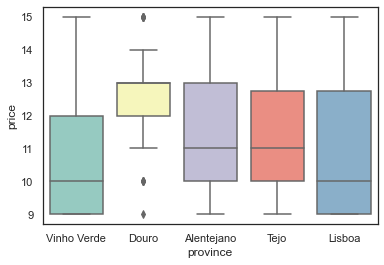

In [471]:
# Create a new DataFrame with the Top 5 Provinces that produce Portuguese White in Portugal
PT_PW = PT[PT.variety == 'Portuguese White'][wine_sales.province.isin(['Vinho Verde','Douro','Alentejano','Tejo','Lisboa'])]

# Remove price outliers from ortuguese White DataFrame
q_low = PT_PW["price"].quantile(0.10)
q_hi  = PT_PW["price"].quantile(0.75)

PT_PW_filtered = PT_PW[(PT_PW["price"] < q_hi) & (PT_PW["price"] > q_low)]

# Boxplot comparing price and the top 5 Portuguese White provinces in Portugal 
ax = sns.boxplot(x="province", y="price", data=PT_PW_filtered, order=['Vinho Verde','Douro','Alentejano','Tejo','Lisboa'], palette="Set3")